In [15]:
#Base libraries for interactive work
import numpy as np #We will make extensive use of Numpy arrays 
import multiprocessing as mp #Enable multiprocessing
from astropy.io import fits #astropy modules for FITS IO
import re #to extract trim sections for FITS header

#Based libraries for iPython Plots
import matplotlib  #ploting
matplotlib.use("Agg")  #some hack to stop the bouncing python icon when plotting of os/x
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm #for better display of FITS images
import time as t
%matplotlib inline

import neossatlib as neo  #Main Python Libs for NEOSSat processing.  

In [16]:
workdir='Data/Borisov New/'                #Directory that contains cleaned FITS files (don't forget the trailing '/')
savedir="Data/Borisov Clean"
fileslist='files_clean_1.list'     #Simple text file that contains the names of all the FITS files to process.   

bpix=-1.0e10                   #value to mark bad pixels. Any pixel *below* bpix is considered invalid.
sigscalel=1.0                  #low bounds for display clipping.  Keep small to keep background 'dark'
sigscaleh=1.0                  #high bounds for display clipping.
nprocessor=24                  #Number of processors to use for data processing. 
#--- Parameters for making a Dark image ---#
ilow=1                         #number of low value frames to reject when generating dark image
ihigh=1                        #number of high value frames to reject when generating dark image
#--- Parameters for Fourier Decomp. ---#
snrcut=10.0  #When to stop decomposition 
fmax=2 #Maximum number of frequencies in model
xoff=0 #pixel offsets 
yoff=0
T=8 #Oversampling for FFT calculations to better estimate frequency of electronic interference.  
info=0 # 0 - no plots, no output, 1 - no plots, output, 2 - plots, output

imagefiles=neo.read_file_list(fileslist)

In [17]:
#Use the first image to set dimensions for processing.
i=0 #index of first image.  
filename=workdir+imagefiles[i]
trim,btrim,xsc,ysc,xov,yov=neo.getimage_dim(filename)

In [18]:
darklist=[]
nfiles=len(imagefiles)
icount=0
for i in range(nfiles):
    filename=workdir+imagefiles[i]
    hdulist = fits.open(filename)
    shutter=hdulist[0].header['SHUTTER']
    if int(shutter[0]) != 0:  #Check if shutter was open or closed.
        darklist.append(imagefiles[i])
    hdulist.close()
    icount=icount+1 #simple counter to track images reviewed.
print("Number of dark images: ",len(darklist))

Number of dark images:  3


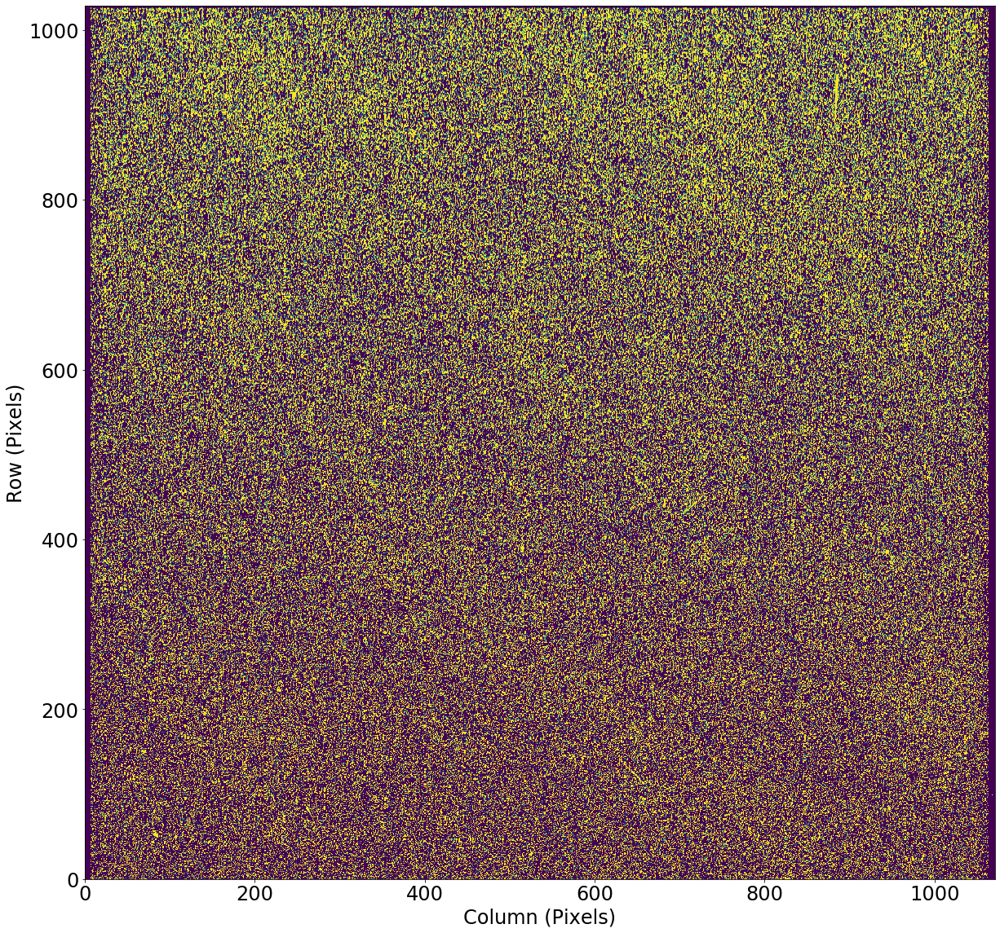

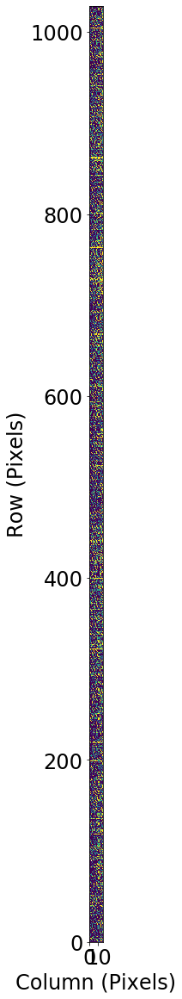

In [19]:
image=neo.read_fitsdata(workdir+darklist[0])

#Plot Science Raster
imstat=neo.imagestat(image[trim[2]:trim[3],trim[0]:trim[1]],bpix)
neo.plot_image(image[trim[2]:trim[3],trim[0]:trim[1]],imstat,0.1,1.5)  #The last two parameters control the plot scale (sigma-low, sigma-high)

#Plot Overscan Raster
imstat=neo.imagestat(image[btrim[2]:btrim[3],btrim[0]:btrim[1]],bpix)
neo.plot_image(image[btrim[2]:btrim[3],btrim[0]:btrim[1]],imstat,0.1,1.5)

In [22]:
pool = mp.Pool(processes=nprocessor)  #Use lots of threads - because we can! 
results = [pool.apply_async(neo.darkprocess, args=(workdir,darkfile,xsc,ysc,xov,yov,snrcut,fmax,xoff,yoff,T,\
                bpix,)) for darkfile in darklist]
alldarkdata = [p.get() for p in results]
pool.close()
pool.join()

In [23]:
darkavg=neo.combinedarks(alldarkdata)

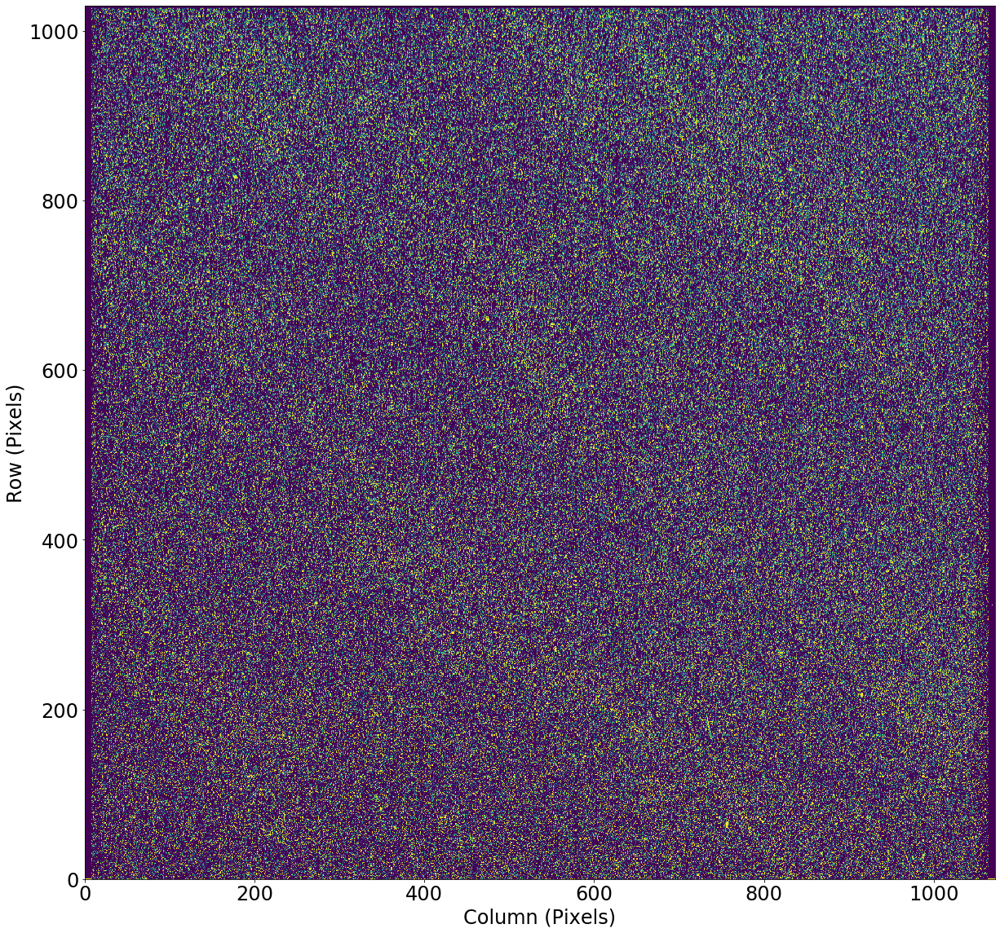

In [24]:
imstat=neo.imagestat(darkavg,bpix)
neo.plot_image(darkavg,imstat,0.3,10.0)

In [25]:
alldarkdata = []

In [26]:
lightlist=[]
jddate=[]
exptime=[]
nfiles=len(imagefiles)
for i in range(nfiles):
    filename=workdir+imagefiles[i]
    hdulist = fits.open(filename)
    shutter=hdulist[0].header['SHUTTER']
    mode=hdulist[0].header['MODE']
    # Mode=16 => Fine point.  Mode=13 => Fine Slew
    if (int(shutter[0]) == 0) & ( (int(mode[0:2]) == 16) or (int(mode[0:2]) == 13) ):  #Check if shutter was open or closed.
        lightlist.append(imagefiles[i])
        jddate.append(float(hdulist[0].header['JD-OBS']))
        exptime.append(float(hdulist[0].header['EXPOSURE']))
    hdulist.close()
jddate=np.array(jddate)
exptime=np.array(exptime)
print("number of images: ",len(lightlist))

number of images:  12


1616.0 65535.0


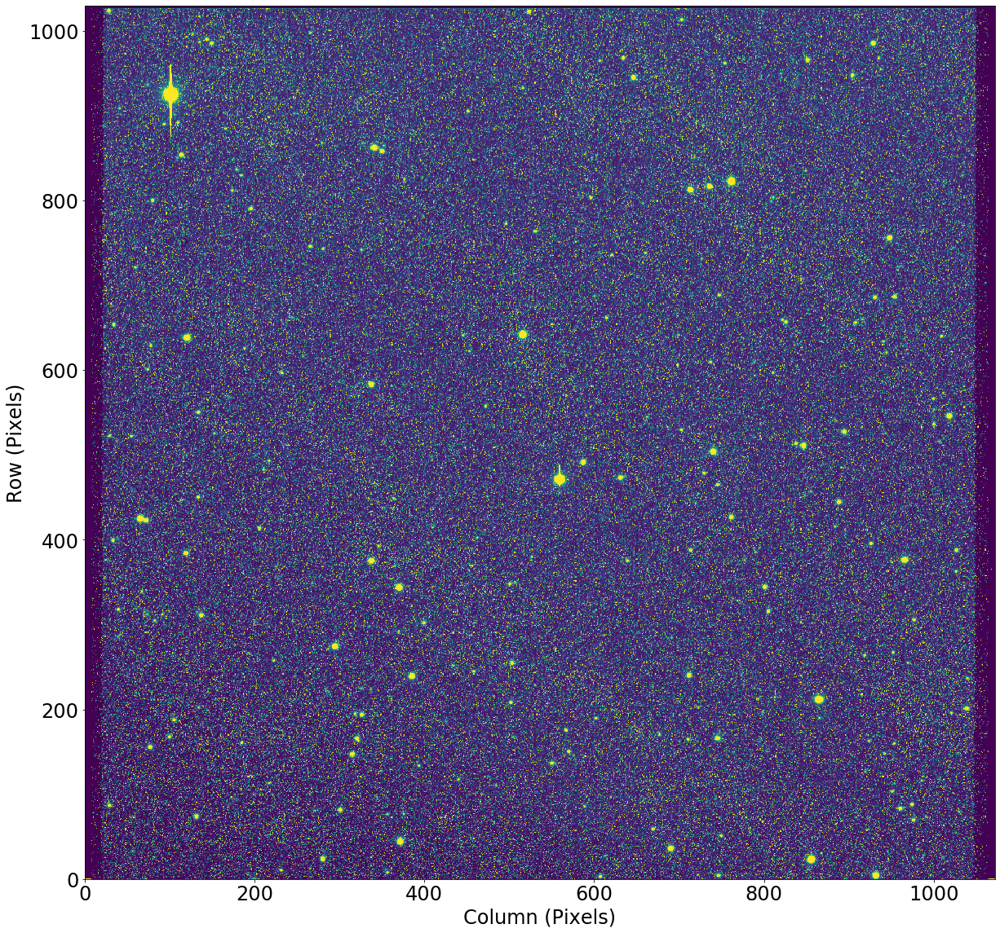

In [27]:
filename=workdir+lightlist[int(len(lightlist)/2)]  #pick an image somewhere around the middle.  
scidata=neo.read_fitsdata(filename)
print(np.min(scidata),np.max(scidata))
#Crop Science Image
sh=scidata.shape
strim=np.array([sh[0]-xsc,sh[0],sh[1]-ysc,sh[1]])
scidata_c=np.copy(scidata[strim[0]:strim[1],strim[2]:strim[3]])
imstat=neo.imagestat(scidata_c,bpix)
neo.plot_image(scidata_c,imstat,1.0,10.0)

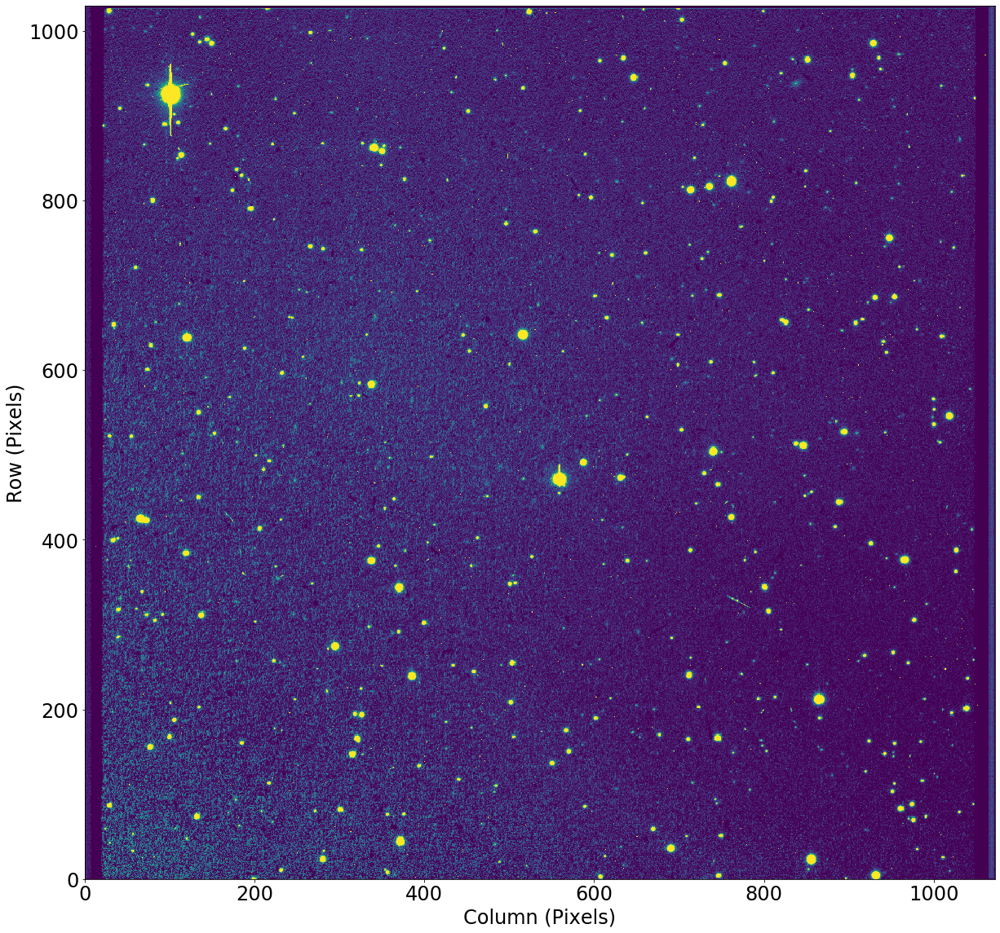

In [30]:
scidata_cord=\
  neo.clean_sciimage(filename,darkavg,xsc,ysc,xov,yov,snrcut,fmax,xoff,yoff,T,info,bpix)

imstat=neo.imagestat(scidata_cord,bpix)
neo.plot_image(scidata_cord,imstat,1.0,10.0)

In [ ]:
from tqdm import tqdm_notebook #For monitoring process of big jobs
def barupdate(result):
    pbar.update()
    
pool = mp.Pool(processes=24)  #How many threads to use.
results = [pool.apply_async(neo.lightprocess_save, args=(workdir+lightlist[i],savedir,darkavg,xsc,ysc,xov,yov,\
           snrcut,fmax,xoff,yoff,T,bpix,),callback=barupdate)\
           for i in range(len(lightlist))]
saveall = [p.get() for p in results]
pool.close()
pool.join()

Exception in thread Thread-24:
Traceback (most recent call last):
  File "c:\users\exoce\appdata\local\programs\python\python37\lib\threading.py", line 926, in _bootstrap_inner
    self.run()
  File "c:\users\exoce\appdata\local\programs\python\python37\lib\threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "c:\users\exoce\appdata\local\programs\python\python37\lib\multiprocessing\pool.py", line 486, in _handle_results
    cache[job]._set(i, obj)
  File "c:\users\exoce\appdata\local\programs\python\python37\lib\multiprocessing\pool.py", line 662, in _set
    self._callback(self._value)
  File "<ipython-input-32-268f68dd6eac>", line 3, in barupdate
    pbar.update()
NameError: name 'pbar' is not defined

